# Name:- Sojas Khandagale

# GitHub UserName:- sojas07

# USC ID:- 4955206780

# 1. Decision Trees as Interpretable Models

## (b) Build a decision tree on the whole data set and plot it.

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import os
import math
from sklearn import tree
from sklearn.tree import export_text
from sklearn.tree import _tree
from sklearn.impute import SimpleImputer
from scipy.stats import variation
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression, RidgeCV, Ridge, LassoCV,Lasso
from sklearn import metrics
from sklearn.metrics import confusion_matrix, precision_score, f1_score, classification_report, log_loss, accuracy_score, mean_squared_error
from sklearn.linear_model import RidgeCV, LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.decomposition import PCA
from sklearn import model_selection
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

In [2]:
df = pd.read_csv('../data/HW5/diagnosis.data',sep='\t',header=None,encoding='utf-16')
columns = ['Temperature of patient','Occurrence of nausea','Lumbar pain','Urine pushing','Micturition pains','Burning','Inflammation of urinary bladder','Nephritis of renal pelvis origin']
df.columns = columns

In [3]:
df

,Temperature of patient,Occurrence of nausea,Lumbar pain,Urine pushing,Micturition pains,Burning,Inflammation of urinary bladder,Nephritis of renal pelvis origin
0,"35,5",no,yes,no,no,no,no,no
1,"35,9",no,no,yes,yes,yes,yes,no
2,"35,9",no,yes,no,no,no,no,no
3,"36,0",no,no,yes,yes,yes,yes,no
4,"36,0",no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,"41,4",no,yes,yes,no,yes,no,yes
116,"41,5",no,no,no,no,no,no,no
117,"41,5",yes,yes,no,yes,no,no,yes
118,"41,5",no,yes,yes,no,yes,no,yes


In [4]:
df['Temperature of patient'] = df['Temperature of patient'].str.replace(',', '.').astype(float)
df = df.replace({'yes': 1, 'no': 0})
df

,Temperature of patient,Occurrence of nausea,Lumbar pain,Urine pushing,Micturition pains,Burning,Inflammation of urinary bladder,Nephritis of renal pelvis origin
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
115,41.4,0,1,1,0,1,0,1
116,41.5,0,0,0,0,0,0,0
117,41.5,1,1,0,1,0,0,1
118,41.5,0,1,1,0,1,0,1


In [5]:
clf = tree.DecisionTreeClassifier()
X = df.iloc[:, :-2]
y = df.iloc[:,-2:]
clf = clf.fit(X, y)

[Text(0.4, 0.9, 'x[0] <= 37.95\ngini = 0.493\nsamples = 120\nvalue = [[61, 59]\n[70, 50]]'),
 Text(0.2, 0.7, 'x[2] <= 0.5\ngini = 0.222\nsamples = 60\nvalue = [[20, 40]\n[60, 0]]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 40\nvalue = [[0, 40]\n[40, 0]]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 20\nvalue = [[20, 0]\n[20, 0]]'),
 Text(0.6, 0.7, 'x[2] <= 0.5\ngini = 0.355\nsamples = 60\nvalue = [[41, 19]\n[10, 50]]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[10, 0]]'),
 Text(0.7, 0.5, 'x[4] <= 0.5\ngini = 0.236\nsamples = 50\nvalue = [[31, 19]\n[0, 50]]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 21\nvalue = [[21, 0]\n[0, 21]]'),
 Text(0.8, 0.3, 'x[3] <= 0.5\ngini = 0.226\nsamples = 29\nvalue = [[10, 19]\n[0, 29]]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[0, 10]]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 19\nvalue = [[0, 19]\n[0, 19]]')]

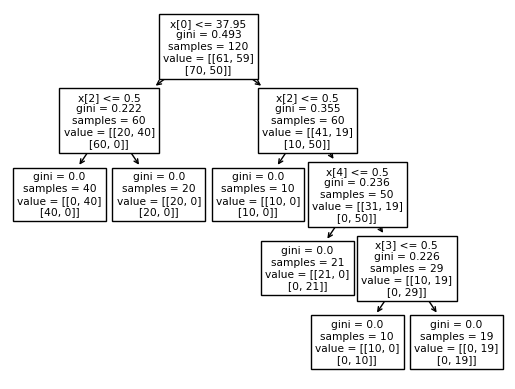

In [6]:
tree.plot_tree(clf)

## (c) Convert the decision rules into a set of IF-THEN rules.

In [7]:
# Reference : https://www.kdnuggets.com/2017/05/simplifying-decision-tree-interpretation-decision-rules-python

def tree_to_code(tree, feature_names): 
    '''
            Outputs a decision tree model as if/then pseudocode
    Parameters:
    -----------
    tree: decision tree model
    The decision tree to represent as pseudocode feature_names: list
                    The feature names of the dataset used for building the decision tree
    '''
    left = tree.tree_.children_left
    
    right = tree.tree_.children_right
    
    threshold = tree.tree_.threshold
    
    features = [feature_names[i] for i in tree.tree_.feature] 
    
    value = tree.tree_.value
    
    def recurse(left, right, threshold, features, node, depth=0): 
        indent=" "*depth
        
        if (threshold[node] != -2):
            print(indent,"if ( " + features[node] + " <= " + str(threshold[node]) + " ) {")
        
            if left[node] != -1:
                recurse (left, right, threshold, features, left[node], depth+1) 
                print(indent,"} else {")
                if right[node] != -1:
                    recurse (left, right, threshold, features, right[node], depth+1)
                print(indent,"}")
        else:
            print(indent,"return " + str(value[node]))
    recurse(left, right, threshold, features, 0)

In [8]:
tree_to_code(clf, columns[:6])

 if ( Temperature of patient <= 37.95000076293945 ) {
  if ( Lumbar pain <= 0.5 ) {
   return [[ 0. 40.]
 [40.  0.]]
  } else {
   return [[20.  0.]
 [20.  0.]]
  }
 } else {
  if ( Lumbar pain <= 0.5 ) {
   return [[10.  0.]
 [10.  0.]]
  } else {
   if ( Micturition pains <= 0.5 ) {
    return [[21.  0.]
 [ 0. 21.]]
   } else {
    if ( Urine pushing <= 0.5 ) {
     return [[10.  0.]
 [ 0. 10.]]
    } else {
     return [[ 0. 19.]
 [ 0. 19.]]
    }
   }
  }
 }


## (d) Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.

In [9]:
X = df.iloc[:, :-2]
y = df.iloc[:,-2:]

path = clf.cost_complexity_pruning_path(X, y)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [10]:
ccp_alphas

array([0.        , 0.04908333, 0.07947222, 0.11111111, 0.20423611])

In [11]:
scores = []
clfs = []
for ccp_alpha in ccp_alphas:
    clf = tree.DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X, y)
    clfs.append(clf)
    score = clf.score(X, y)
    scores.append(score)
    print(f'alpha:{ccp_alpha}\tscore:{score}\tno_of_nodes: {clf.tree_.node_count}\tdepth: {clf.tree_.max_depth}\n')

alpha:0.0	score:1.0	no_of_nodes: 11	depth: 4

alpha:0.04908333333333333	score:0.8416666666666667	no_of_nodes: 7	depth: 2

alpha:0.07947222222222226	score:0.7583333333333333	no_of_nodes: 5	depth: 2

alpha:0.1111111111111111	score:0.5916666666666667	no_of_nodes: 3	depth: 1

alpha:0.204236111111111	score:0.25	no_of_nodes: 1	depth: 0



In [12]:
best_alpha = ccp_alphas[0]
best_accuracy = scores[0]
best_clf = tree.DecisionTreeClassifier(random_state=0,ccp_alpha=best_alpha)
best_clf.fit(X,y)

DecisionTreeClassifier(random_state=0)

[Text(0.4, 0.9, 'x[0] <= 37.95\ngini = 0.493\nsamples = 120\nvalue = [[61, 59]\n[70, 50]]'),
 Text(0.2, 0.7, 'x[3] <= 0.5\ngini = 0.222\nsamples = 60\nvalue = [[20, 40]\n[60, 0]]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 20\nvalue = [[20, 0]\n[20, 0]]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 40\nvalue = [[0, 40]\n[40, 0]]'),
 Text(0.6, 0.7, 'x[2] <= 0.5\ngini = 0.355\nsamples = 60\nvalue = [[41, 19]\n[10, 50]]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[10, 0]]'),
 Text(0.7, 0.5, 'x[4] <= 0.5\ngini = 0.236\nsamples = 50\nvalue = [[31, 19]\n[0, 50]]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 21\nvalue = [[21, 0]\n[0, 21]]'),
 Text(0.8, 0.3, 'x[3] <= 0.5\ngini = 0.226\nsamples = 29\nvalue = [[10, 19]\n[0, 29]]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[0, 10]]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 19\nvalue = [[0, 19]\n[0, 19]]')]

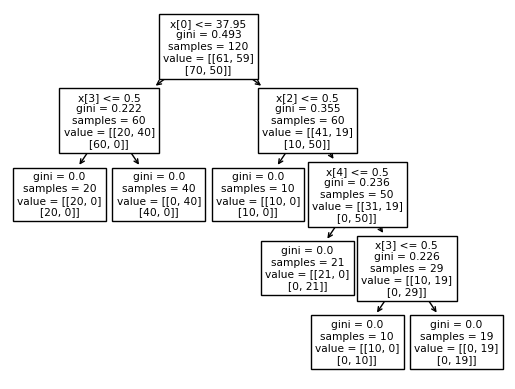

In [13]:
tree.plot_tree(best_clf)

In [14]:
tree_to_code(best_clf, columns[:6])

 if ( Temperature of patient <= 37.95000076293945 ) {
  if ( Urine pushing <= 0.5 ) {
   return [[20.  0.]
 [20.  0.]]
  } else {
   return [[ 0. 40.]
 [40.  0.]]
  }
 } else {
  if ( Lumbar pain <= 0.5 ) {
   return [[10.  0.]
 [10.  0.]]
  } else {
   if ( Micturition pains <= 0.5 ) {
    return [[21.  0.]
 [ 0. 21.]]
   } else {
    if ( Urine pushing <= 0.5 ) {
     return [[10.  0.]
 [ 0. 10.]]
    } else {
     return [[ 0. 19.]
 [ 0. 19.]]
    }
   }
  }
 }


# 2. The LASSO and Boosting for Regression 

## (a) Download the Communities and Crime data 3 from https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime . Use the first 1495 rows of data as the training set and the rest as the test set.

In [15]:
columns =["state","county","community","communityname","fold","population","householdsize","racepctblack","racePctWhite",
"racePctAsian","racePctHisp","agePct12t21","agePct12t29","agePct16t24","agePct65up","numbUrban","pctUrban","medIncome",
"pctWWage","pctWFarmSelf","pctWInvInc","pctWSocSec","pctWPubAsst","pctWRetire","medFamInc","perCapInc","whitePerCap",
"blackPerCap","indianPerCap","AsianPerCap","OtherPerCap","HispPerCap","NumUnderPov","PctPopUnderPov","PctLess9thGrade",
"PctNotHSGrad","PctBSorMore","PctUnemployed","PctEmploy","PctEmplManu","PctEmplProfServ","PctOccupManu","PctOccupMgmtProf",
"MalePctDivorce","MalePctNevMarr","FemalePctDiv","TotalPctDiv","PersPerFam","PctFam2Par","PctKids2Par","PctYoungKids2Par",
"PctTeen2Par","PctWorkMomYoungKids","PctWorkMom","NumIlleg","PctIlleg","NumImmig","PctImmigRecent","PctImmigRec5",
"PctImmigRec8","PctImmigRec10","PctRecentImmig","PctRecImmig5","PctRecImmig8","PctRecImmig10","PctSpeakEnglOnly",
"PctNotSpeakEnglWell","PctLargHouseFam","PctLargHouseOccup","PersPerOccupHous","PersPerOwnOccHous","PersPerRentOccHous",
"PctPersOwnOccup","PctPersDenseHous","PctHousLess3BR","MedNumBR","HousVacant","PctHousOccup","PctHousOwnOcc","PctVacantBoarded",
"PctVacMore6Mos","MedYrHousBuilt","PctHousNoPhone","PctWOFullPlumb","OwnOccLowQuart","OwnOccMedVal","OwnOccHiQuart","RentLowQ",
"RentMedian","RentHighQ","MedRent","MedRentPctHousInc","MedOwnCostPctInc","MedOwnCostPctIncNoMtg","NumInShelters","NumStreet",
"PctForeignBorn","PctBornSameState","PctSameHouse85","PctSameCity85","PctSameState85","LemasSwornFT","LemasSwFTPerPop",
"LemasSwFTFieldOps","LemasSwFTFieldPerPop","LemasTotalReq","LemasTotReqPerPop","PolicReqPerOffic","PolicPerPop",
"RacialMatchCommPol","PctPolicWhite","PctPolicBlack","PctPolicHisp","PctPolicAsian","PctPolicMinor","OfficAssgnDrugUnits",
"NumKindsDrugsSeiz","PolicAveOTWorked","LandArea","PopDens","PctUsePubTrans","PolicCars","PolicOperBudg","LemasPctPolicOnPatr",
"LemasGangUnitDeploy","LemasPctOfficDrugUn","PolicBudgPerPop","ViolentCrimesPerPop"]

In [16]:
df = pd.read_csv('../data/HW5/communities.data',header=None,na_values = '?')
df.columns = columns
df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [17]:
df_train = df[ : 1495]
df_test = df[1495: ]

## (b) The data set has missing values. Use a data imputation technique to deal with the missing values in the data set. The data description mentions some features are nonpredictive. Ignore those features.

In [18]:
nonPredictiveFeatures = ['state','county','community','communityname','fold']

# Ignoring the non-predictive features
df_train = df_train.loc[:, ~df_train.columns.isin(nonPredictiveFeatures)]
df_test = df_test.loc[:, ~df_test.columns.isin(nonPredictiveFeatures)]

imp = SimpleImputer(missing_values = np.nan, strategy='mean')
df_train.loc[:] = imp.fit_transform(df_train)
df_test.loc[:] = imp.fit_transform(df_test)

In [19]:
df_train

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,0.00,0.59,0.01,0.69,1.00,0.07,0.41,0.28,0.23,0.57,...,0.02,0.14,0.22,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
1491,0.16,0.62,0.03,0.74,0.48,0.42,0.44,0.57,0.40,0.25,...,0.07,0.40,0.14,0.070000,0.050000,0.850000,0.500000,0.61,0.190000,0.20
1492,0.01,0.36,0.95,0.24,0.03,0.01,0.44,0.42,0.27,0.63,...,0.03,0.12,0.01,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.30
1493,0.06,0.53,0.01,0.98,0.05,0.01,0.40,0.40,0.24,0.29,...,0.08,0.15,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03


In [20]:
df_test

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,0.00,0.20,0.03,0.91,0.23,0.05,0.15,0.19,0.09,0.42,...,0.01,0.23,0.73,0.1605,0.065375,0.655375,0.40625,0.00,0.208,0.12
1496,0.00,0.55,0.13,0.78,0.15,0.36,0.48,0.53,0.30,0.10,...,0.01,0.18,0.02,0.1605,0.065375,0.655375,0.40625,0.00,0.208,0.11
1497,0.00,0.52,0.04,0.59,0.05,0.62,0.84,0.78,0.75,0.43,...,0.01,0.18,0.00,0.1605,0.065375,0.655375,0.40625,0.00,0.208,0.12
1498,0.04,0.51,0.07,0.92,0.09,0.03,0.38,0.47,0.27,0.35,...,0.06,0.13,0.16,0.1605,0.065375,0.655375,0.40625,0.00,0.208,0.06
1499,0.03,0.59,0.20,0.75,0.19,0.10,0.38,0.62,0.35,0.11,...,0.03,0.23,0.06,0.1605,0.065375,0.655375,0.40625,0.00,0.208,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.1605,0.065375,0.655375,0.40625,0.00,0.208,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.1605,0.065375,0.655375,0.40625,0.00,0.208,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.0800,0.060000,0.780000,0.00000,0.91,0.280,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.0200,0.020000,0.790000,0.00000,0.22,0.180,0.19


## (c) Plot a correlation matrix for the features in the data set.

In [21]:
X_train = df_train.iloc[:,:-1]
y_train = df_train.iloc[:,-1]

corr_train = X_train.corr()

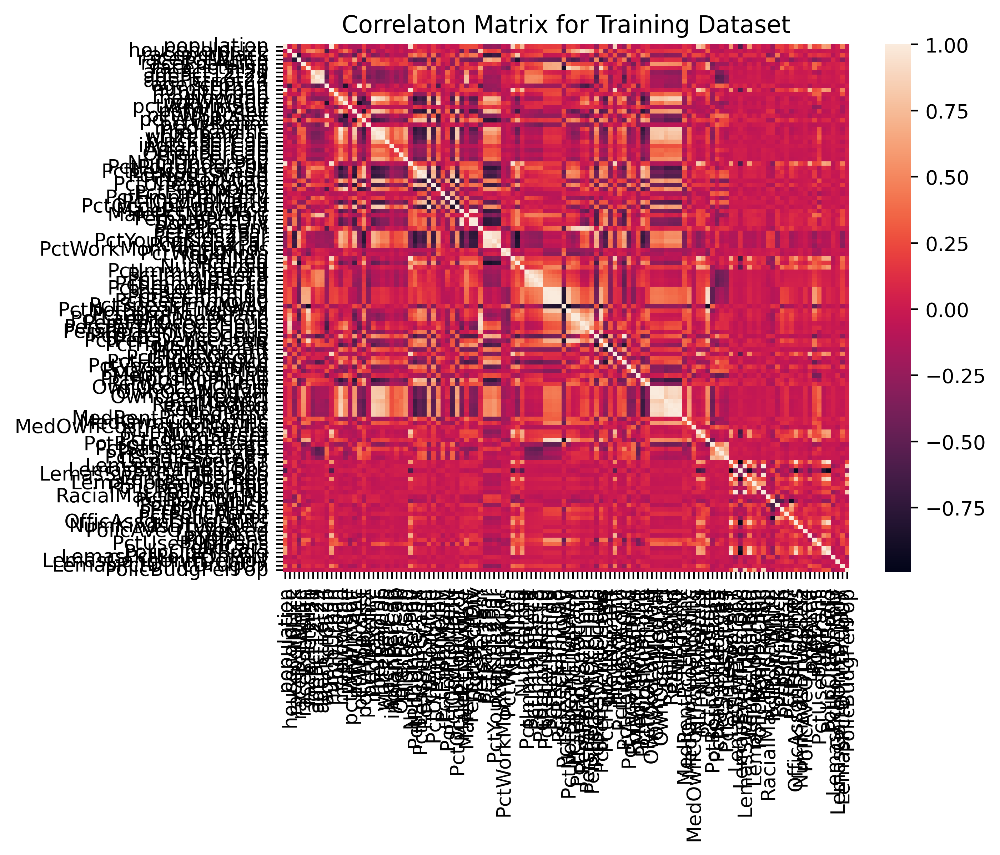

In [22]:
plt.rcParams['figure.dpi'] = 400

sns.heatmap(corr_train, xticklabels = corr_train.columns.values, 
            yticklabels = corr_train.columns.values)

plt.title('Correlaton Matrix for Training Dataset')

plt.show()

In [23]:
X_test = df_test.iloc[:,:-1]
y_test =df_test.iloc[:,-1]

corr_test = X_test.corr()

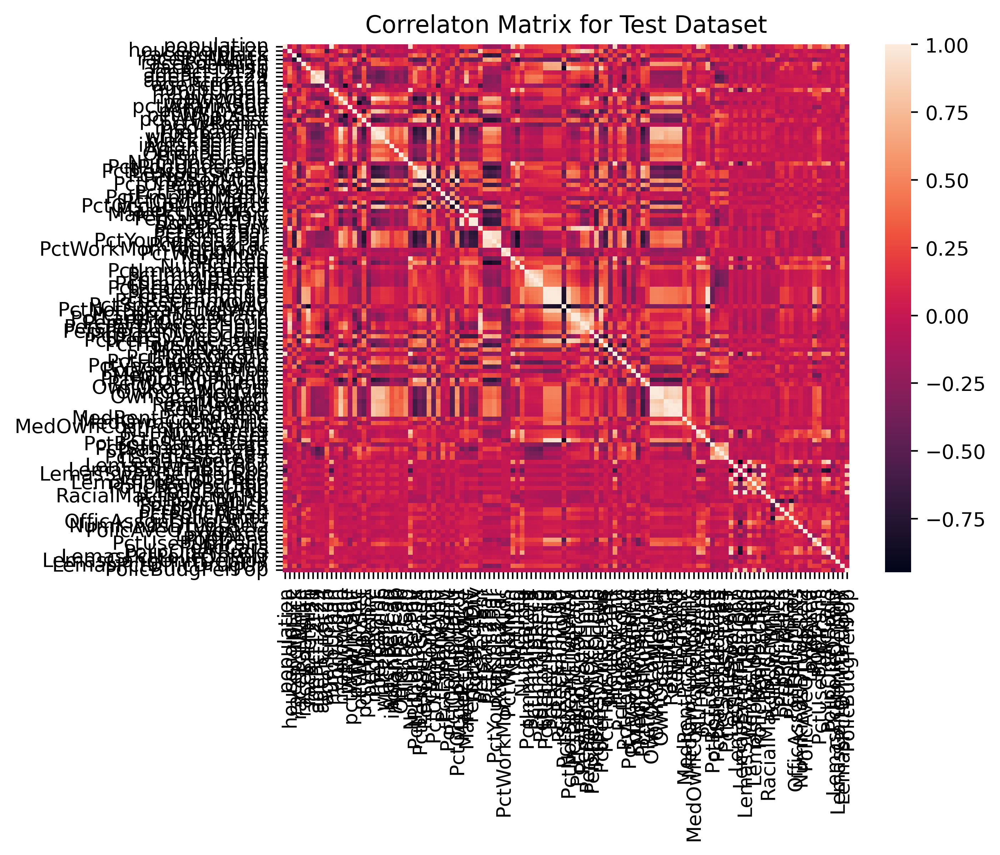

In [24]:
plt.rcParams['figure.dpi'] = 400

sns.heatmap(corr_test, xticklabels = corr_test.columns.values, 
            yticklabels = corr_test.columns.values)

plt.title('Correlaton Matrix for Test Dataset')

plt.show()

## (d) Calculate the Coefficient of Variation CV for each feature, where CV = sm, in which s is sample standard deviation and m is sample mean..

In [25]:
# For Training data

df_CV_train = []

for column in X_train.columns:
    CV = variation(X_train[column])
    row = [column,CV]
    df_CV_train.append(row)
    
df_CV_train = pd.DataFrame(df_CV_train)
df_CV_train.columns = ['Feature Name', 'CV']
df_CV_train

,Feature Name,CV
0,population,2.240355
1,householdsize,0.355681
2,racepctblack,1.428407
3,racePctWhite,0.330102
4,racePctAsian,1.358645
...,...,...
117,PolicOperBudg,0.743238
118,LemasPctPolicOnPatr,0.115700
119,LemasGangUnitDeploy,0.362868
120,LemasPctOfficDrugUn,2.552092


In [26]:
# For Test Data

In [27]:
df_CV_test = []

for column in X_test.columns:
    CV = variation(X_test[column])
    row = [column,CV]
    df_CV_test.append(row)
    
df_CV_test = pd.DataFrame(df_CV_test)
df_CV_test.columns = ['Feature Name', 'CV']
df_CV_test

,Feature Name,CV
0,population,2.075063
1,householdsize,0.345670
2,racepctblack,1.355165
3,racePctWhite,0.303877
4,racePctAsian,1.359350
...,...,...
117,PolicOperBudg,0.644398
118,LemasPctPolicOnPatr,0.139662
119,LemasGangUnitDeploy,0.382467
120,LemasPctOfficDrugUn,2.560678


## (e) Pick √128 features with highest CV , and make scatter plots and box plots for them. Can you draw conclusions about significance of those features, just by the scatter plots?

In [28]:
df_cv_test = df_CV_test.sort_values(by = 'CV', ascending = False)
df_cv_train = df_CV_train.sort_values(by = 'CV', ascending = False)

In [29]:
df_cv_train

,Feature Name,CV
90,NumStreet,4.291487
89,NumInShelters,3.469791
49,NumIlleg,3.057941
51,NumImmig,2.925656
120,LemasPctOfficDrugUn,2.552092
...,...,...
111,NumKindsDrugsSeiz,0.144334
104,RacialMatchCommPol,0.134808
105,PctPolicWhite,0.122772
118,LemasPctPolicOnPatr,0.115700


In [30]:
df_cv_test

,Feature Name,CV
90,NumStreet,4.756329
89,NumInShelters,3.529897
51,NumImmig,2.801175
49,NumIlleg,2.727021
120,LemasPctOfficDrugUn,2.560678
...,...,...
111,NumKindsDrugsSeiz,0.149967
118,LemasPctPolicOnPatr,0.139662
104,RacialMatchCommPol,0.120565
105,PctPolicWhite,0.118158


In [31]:
n = int(math.sqrt(128))

train_features = list(df_cv_train['Feature Name'][:n])
test_features = list(df_cv_test['Feature Name'][:n])

In [32]:
sns.pairplot(X_train[train_features])

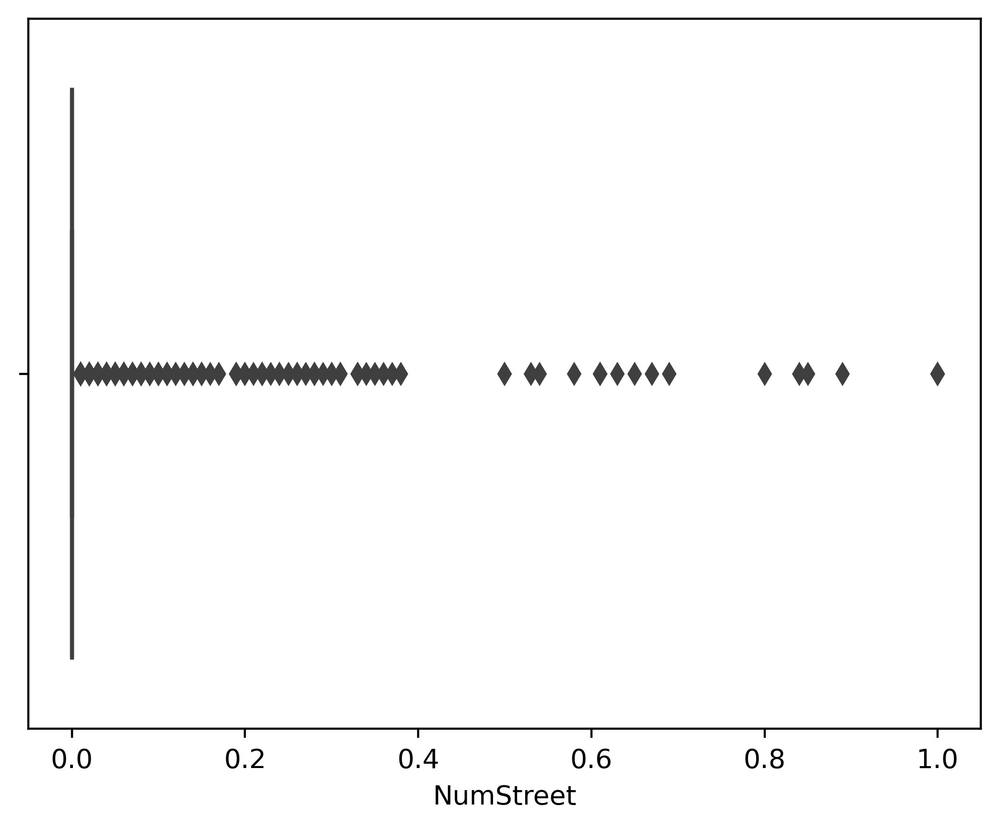

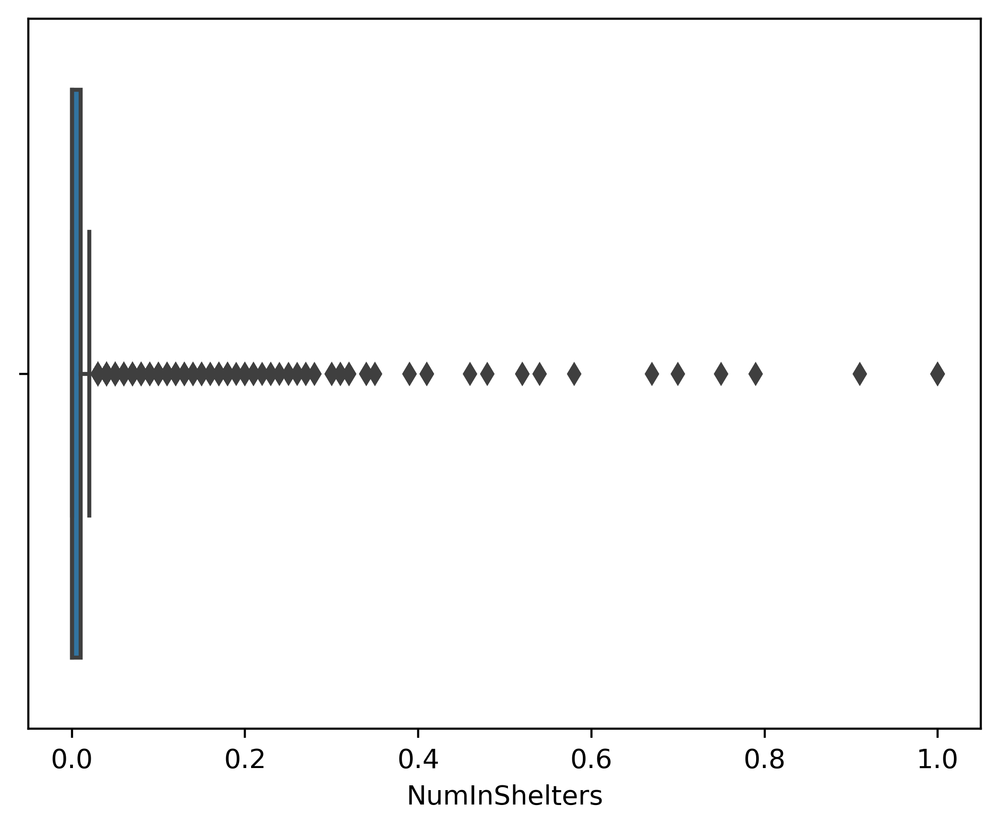

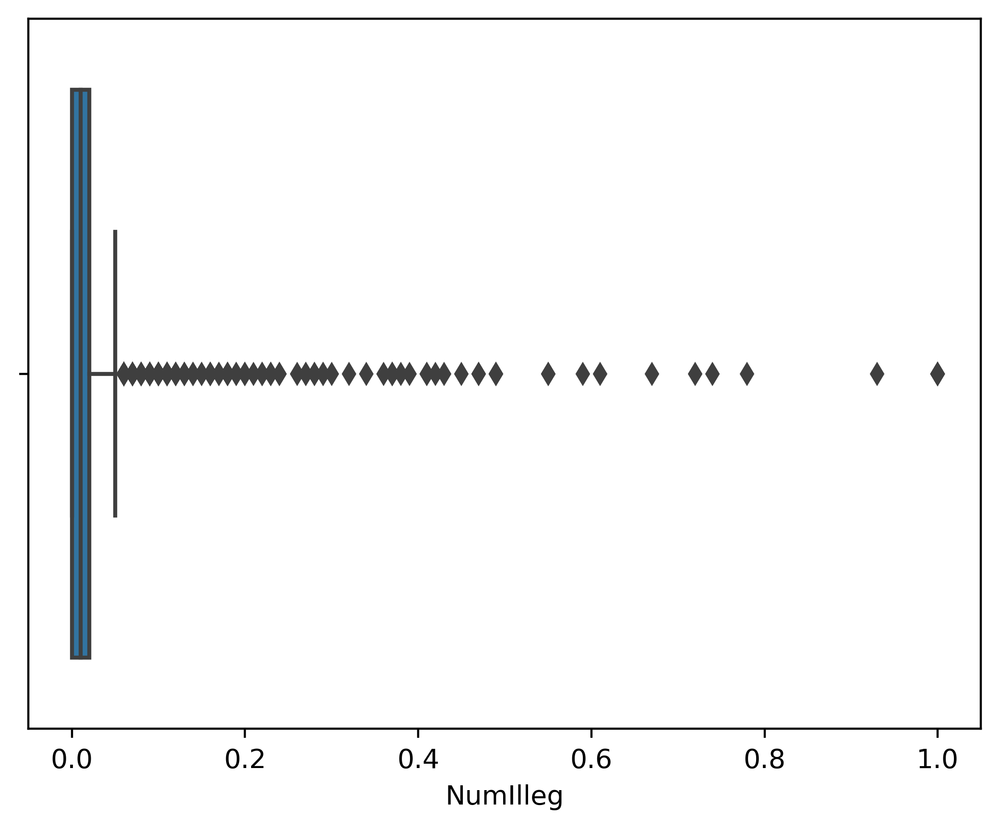

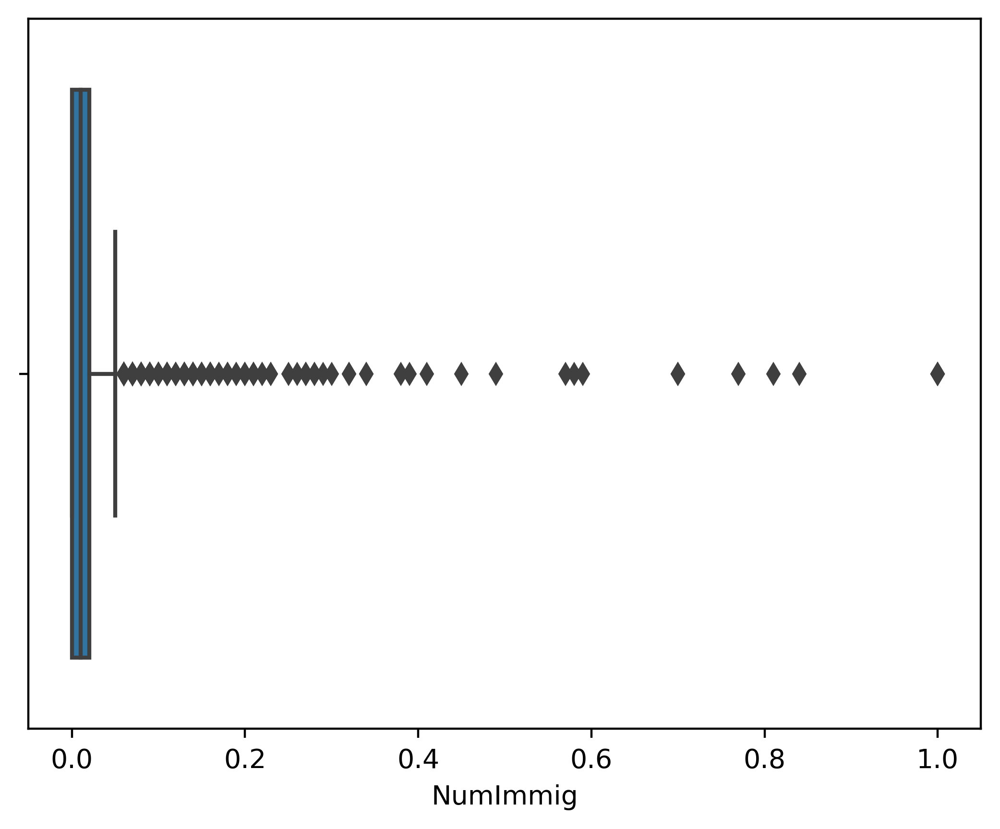

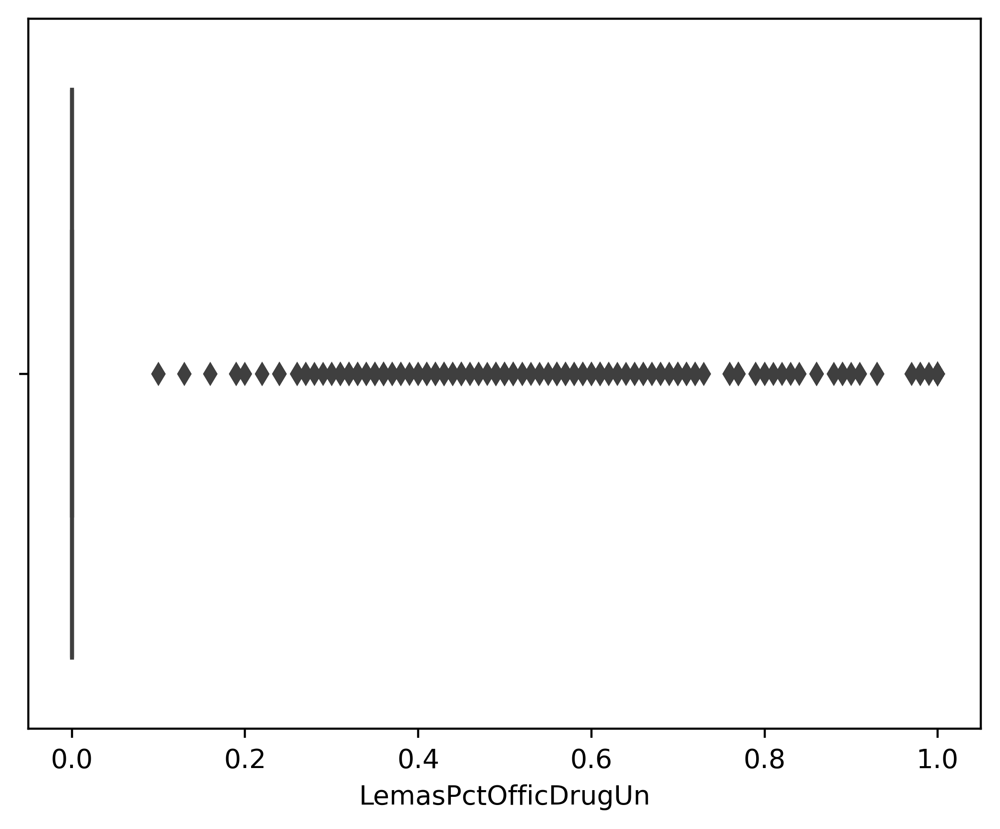

...

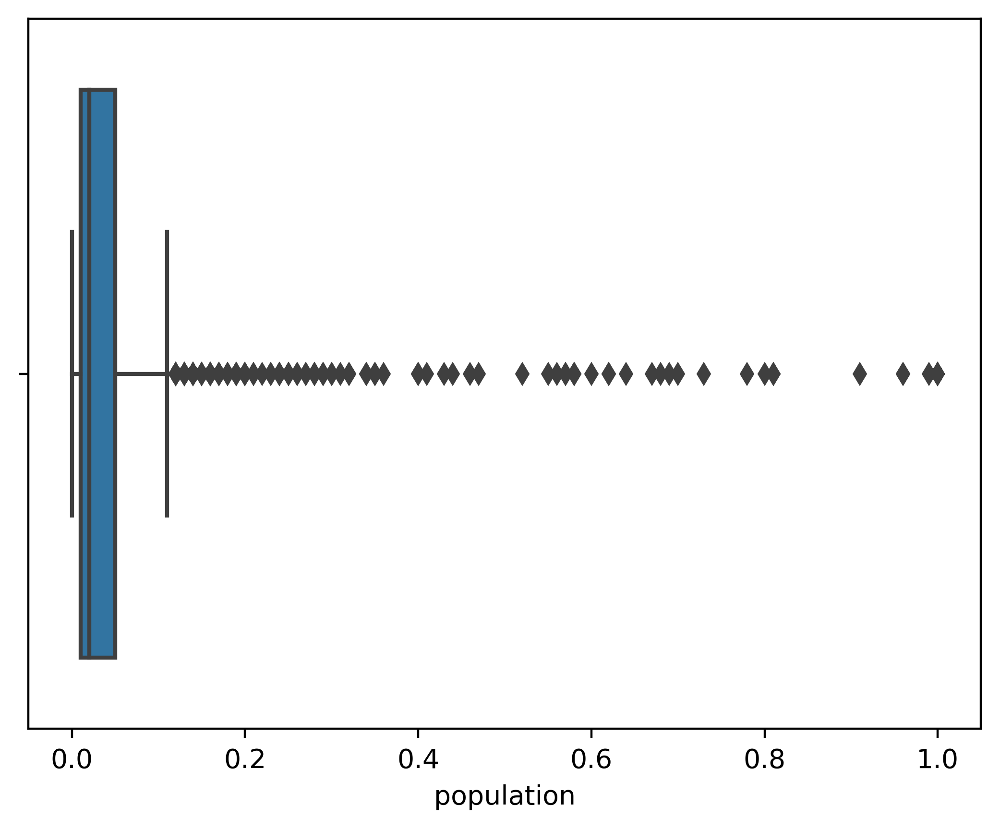

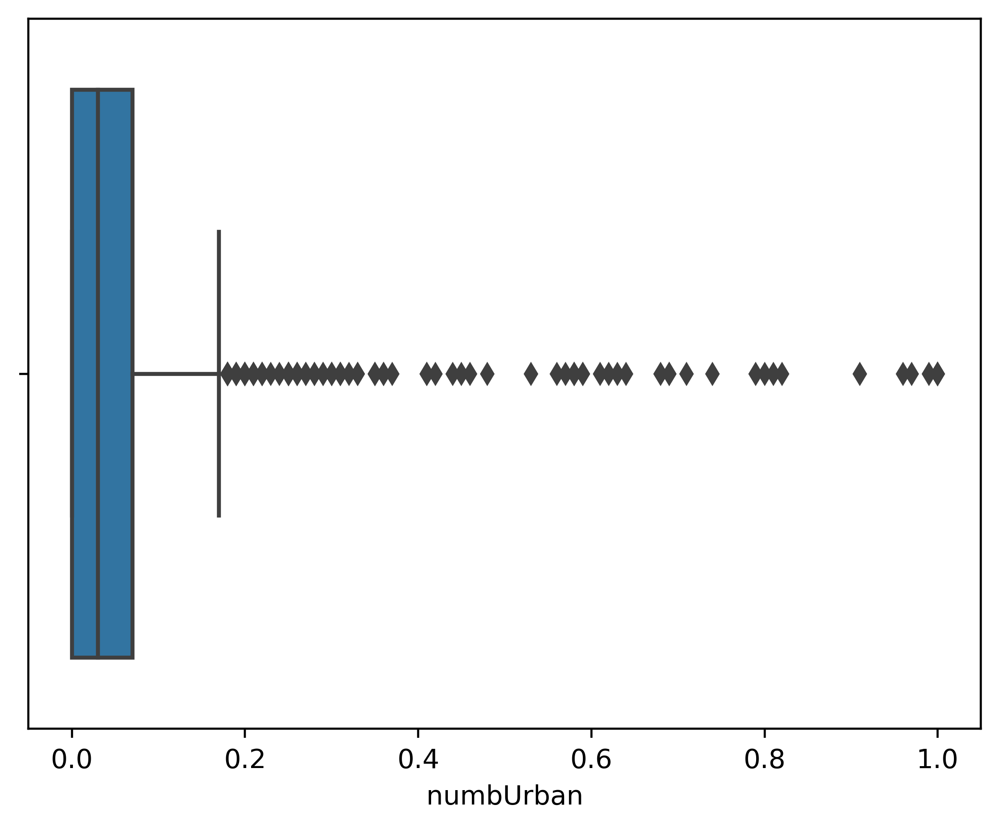

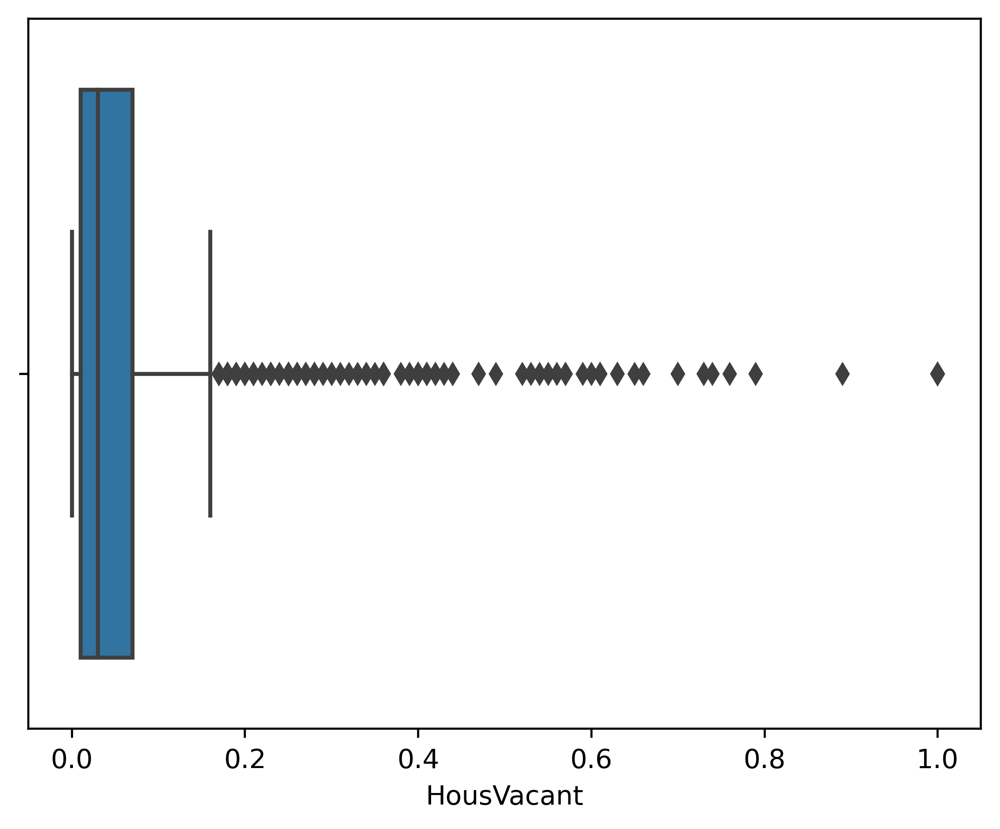

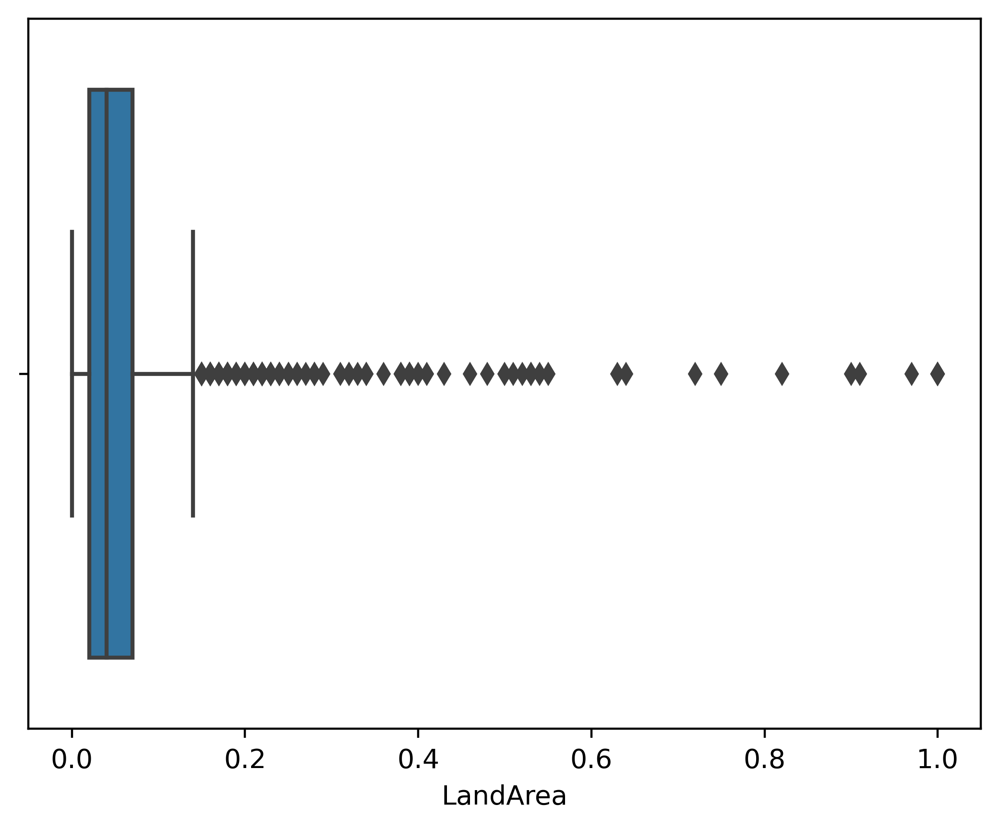

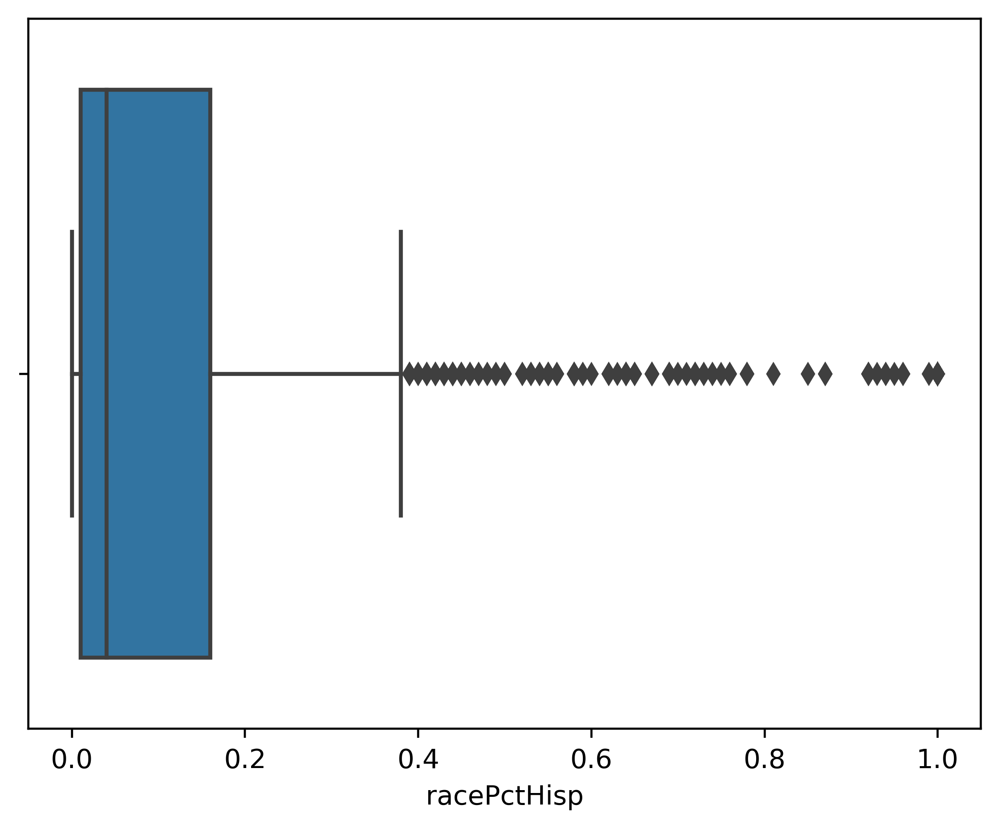

In [33]:
for feature in train_features:
    sns.boxplot(x = X_train[feature], orient='h')
    plt.show()

In [34]:
sns.pairplot(X_test[test_features])

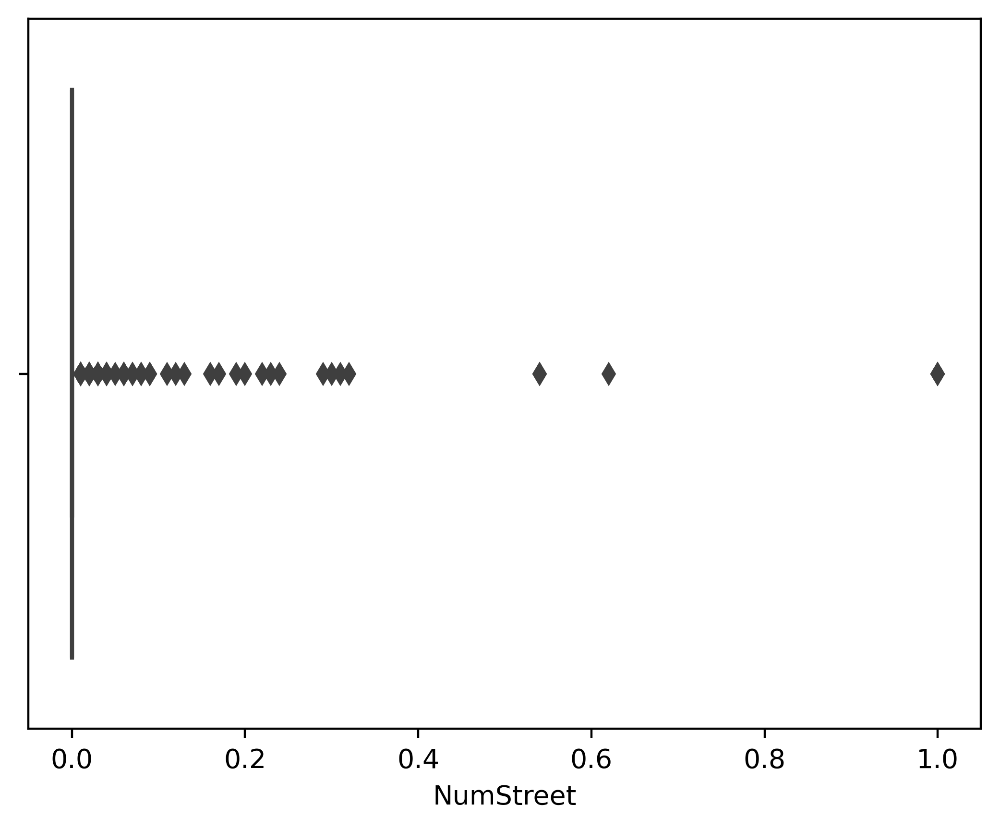

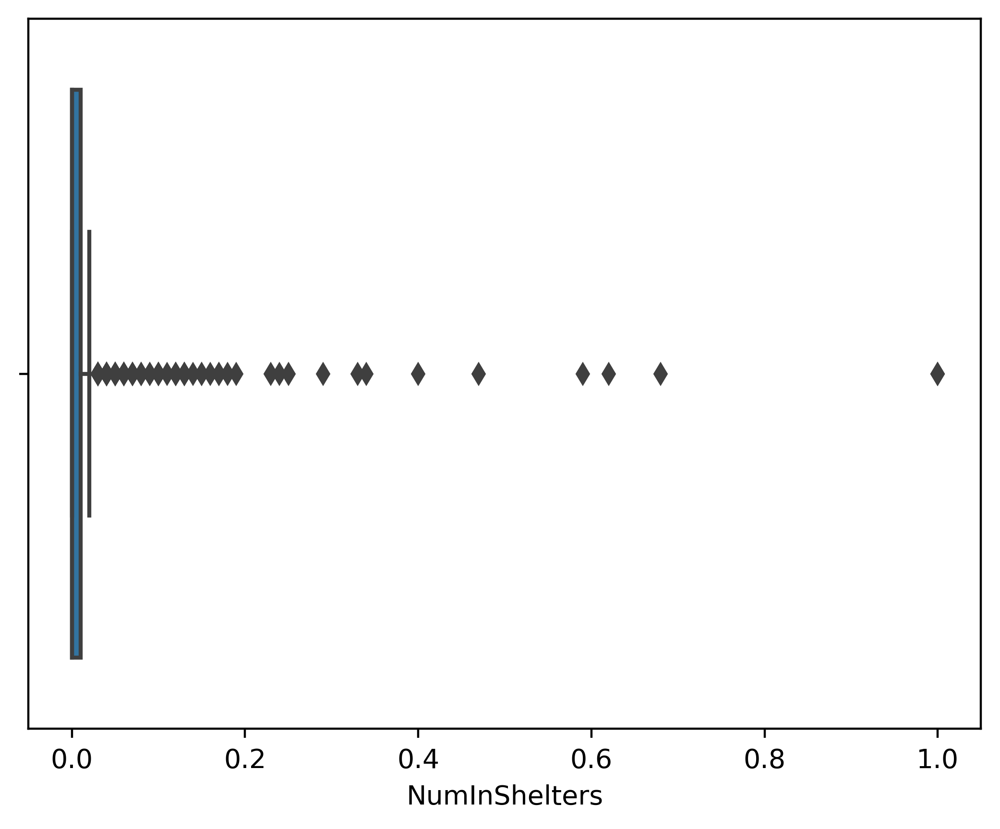

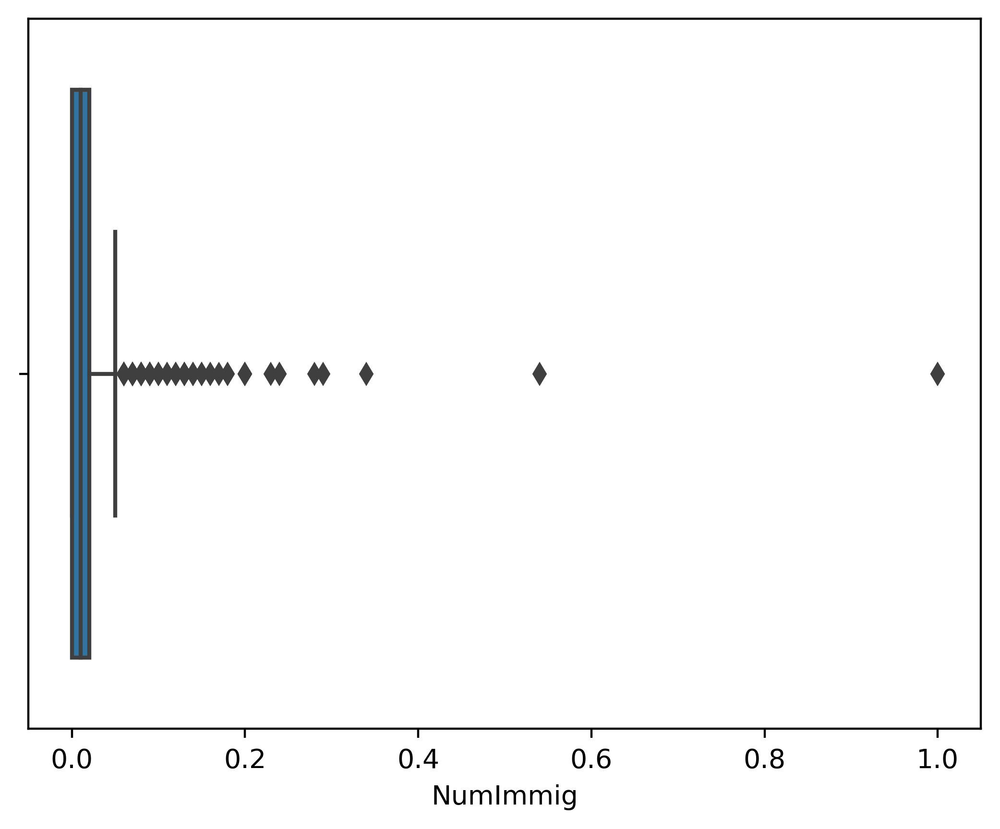

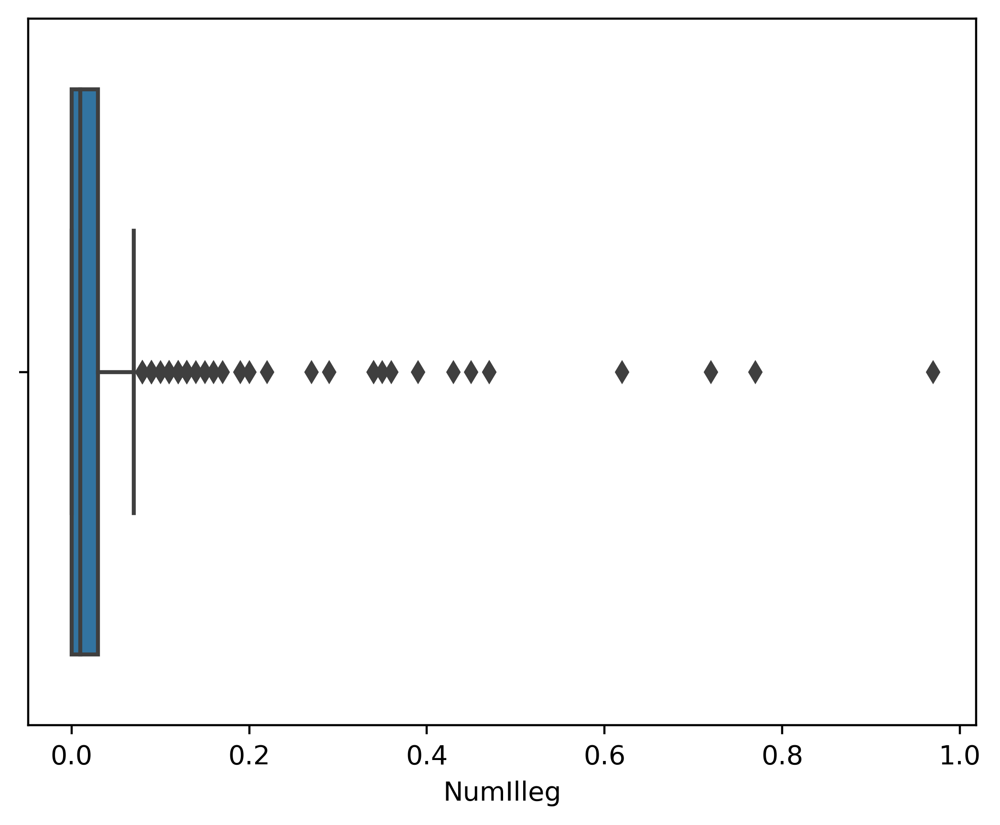

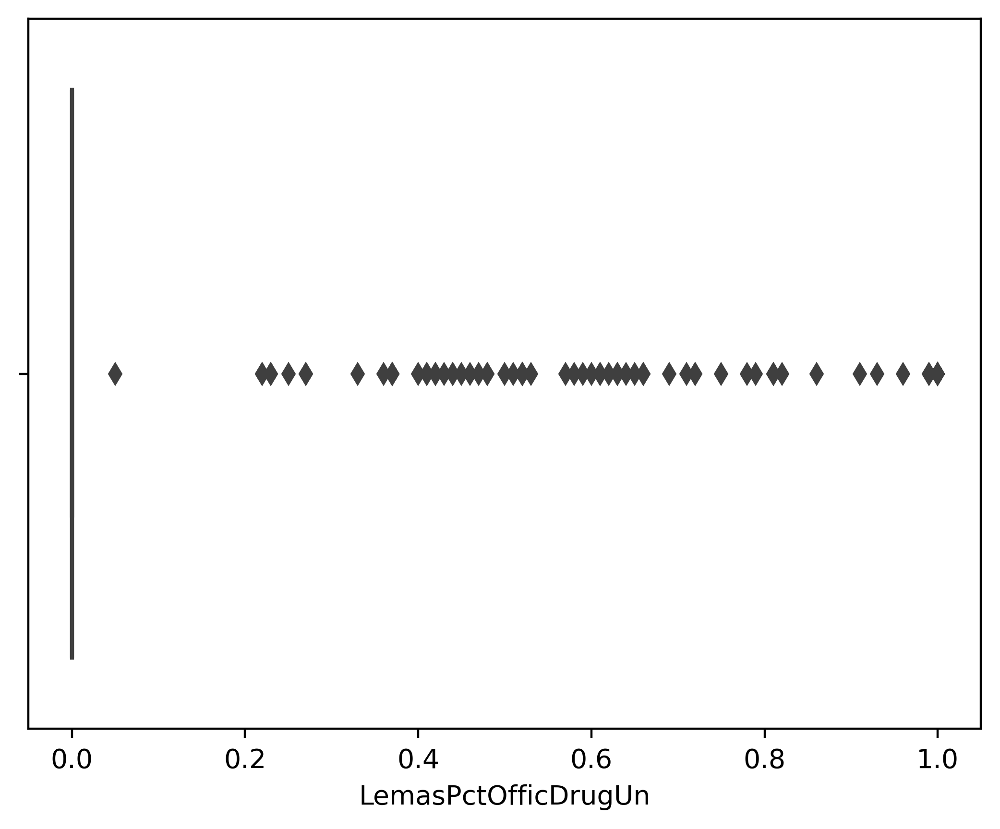

...

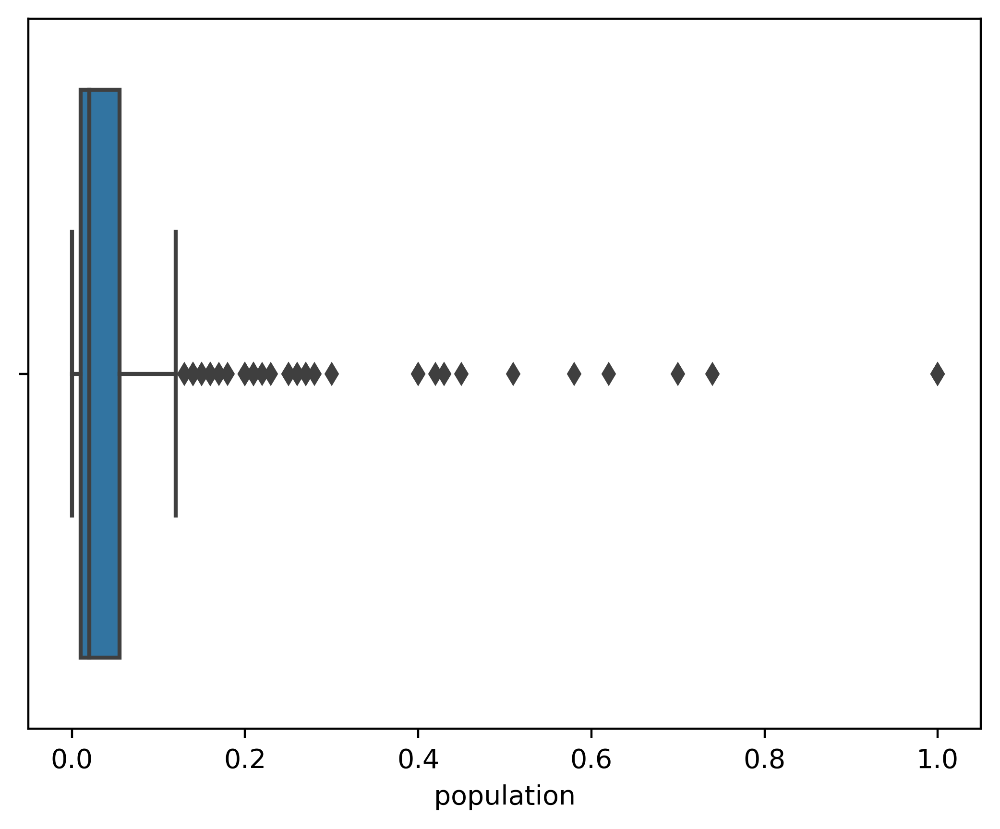

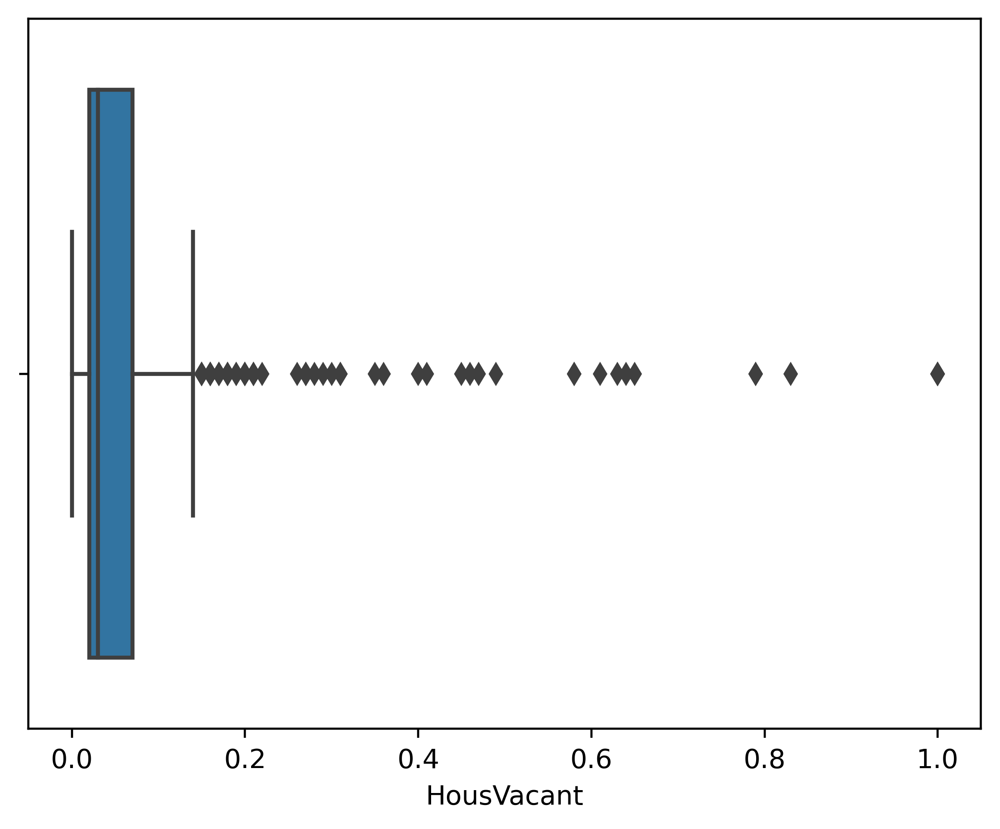

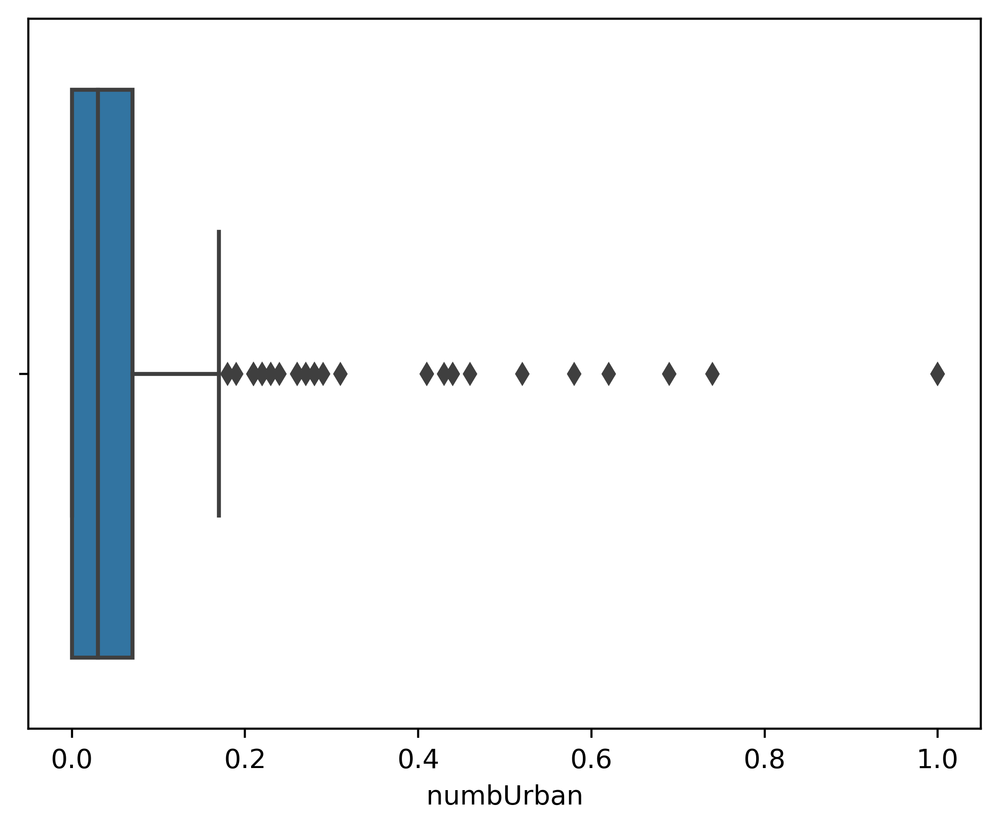

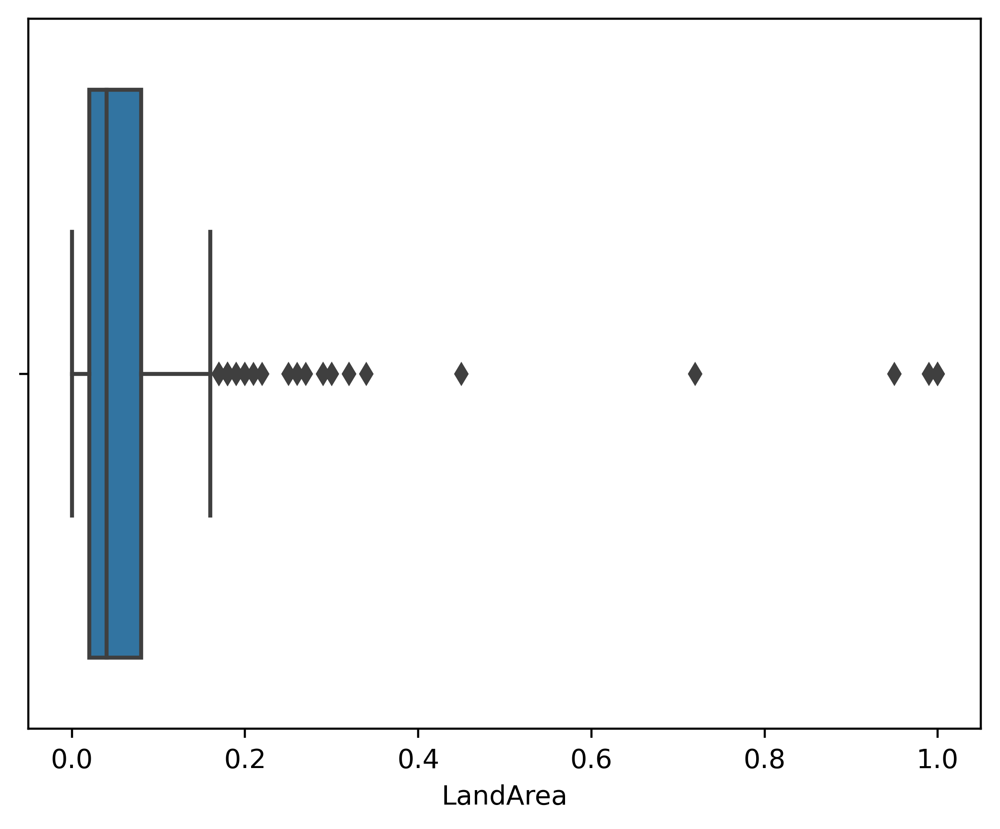

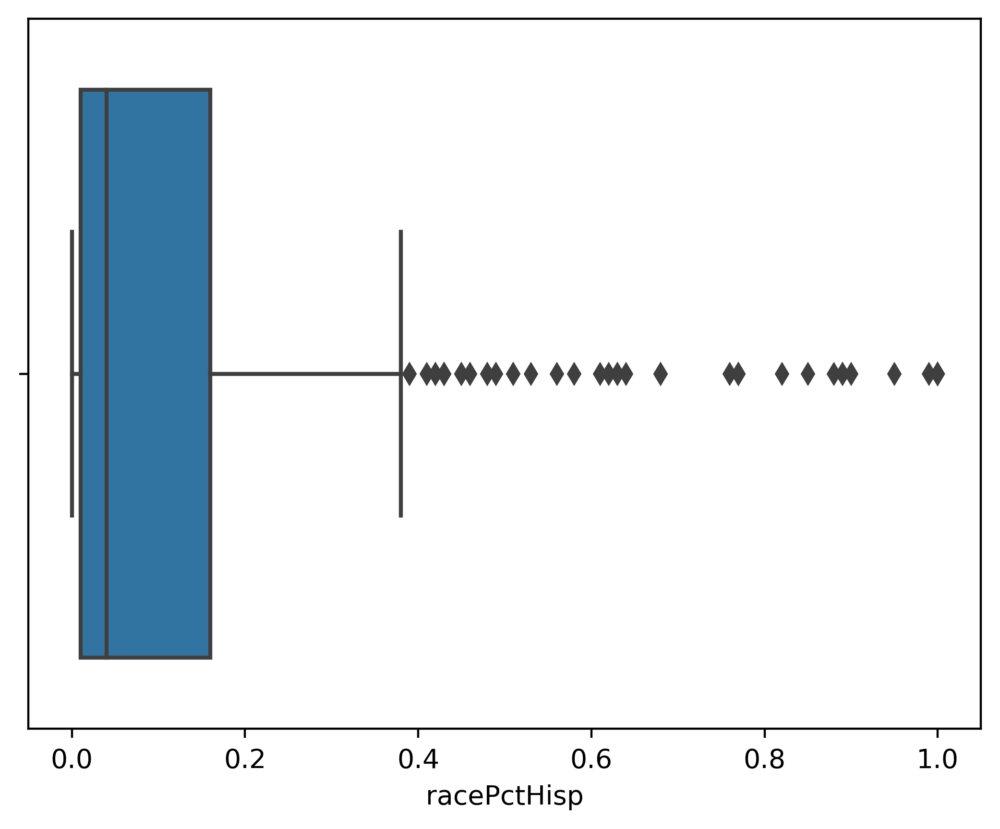

In [35]:
for feature in test_features:
    sns.boxplot(x = X_test[feature], orient='h')
    plt.show()

Inferences:

Scatter Plot:
There is some relationship or trend between the features, as we can see there is a relationship between numbUrban and population, also between numUnderPov and numIlleg, but considering rest, we cannot assure anything by looking at the scatterplots.

Box Plots:
For box plots, each of the feature values are in the range of approximately (0-0.2), and based on this we cannot provide a strong evidence of the significance.

## (f) Fit a linear model using least squares to the training set and report the test error.

In [36]:
X_b = sm.add_constant(X_train)
linearModel = sm.OLS(y_train, X_b).fit()

In [37]:
X_b = sm.add_constant(X_test)
y_pred = linearModel.predict(X_b)

test_error = mean_squared_error(y_test, y_pred)
print('Test Error for Linear Model', test_error)

Test Error for Linear Model 0.018112462026533438


## (g) Fit a ridge regression model on the training set, with λ chosen by cross-validation. Report the test error obtained.

In [38]:
alphas = 10**np.linspace(10,-2,100)

ridgeRegressionModel = RidgeCV(alphas = alphas).fit(X_train, y_train)

y_pred = ridgeRegressionModel.predict(X_test)

test_error = mean_squared_error(y_test, y_pred)
print('Test Error for Ridge Linear Regression ', test_error)

print("The optimal alpha",ridgeRegressionModel.alpha_)
print("The optimal lamda",1/ridgeRegressionModel.alpha_)

Test Error for Ridge Linear Regression  0.017616836535834478
The optimal alpha 2.009233002565046
The optimal lamda 0.49770235643321137


## (h) Fit a LASSO model on the training set, with λ chosen by cross-validation. Report the test error obtained, along with a list of the variables selected by the model. Repeat with standardized 4 features. Report the test error for both cases and compare them.

In [39]:
lassoRegressionModel = LassoCV(max_iter=10000).fit(X_train, y_train)

y_pred = lassoRegressionModel.predict(X_test)

test_error = mean_squared_error(y_test, y_pred)
print('Test Error for Lasso Regression ', test_error)

print("The optimal alpha",lassoRegressionModel.alpha_)
print("The optimal lamda",1/lassoRegressionModel.alpha_)

Test Error for Lasso Regression  0.017735383043771757
The optimal alpha 0.00011614723626829846
The optimal lamda 8609.761472843093


In [40]:
fInds = [i for i, k in enumerate(lassoRegressionModel.coef_) if k != 0]
features_obtained = [list(X_train.columns)[feature] for feature in fInds]
print("Variables selected without Standardization", features_obtained)

Variables selected without Standardization ['racepctblack', 'racePctAsian', 'agePct12t21', 'agePct12t29', 'pctUrban', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'PctPopUnderPov', 'PctLess9thGrade', 'PctEmploy', 'PctEmplManu', 'PctOccupManu', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRec10', 'PctRecImmig10', 'PctNotSpeakEnglWell', 'PctLargHouseOccup', 'PersPerOccupHous', 'PctPersOwnOccup', 'PctPersDenseHous', 'PctHousLess3BR', 'MedNumBR', 'HousVacant', 'PctHousOccup', 'PctVacantBoarded', 'PctVacMore6Mos', 'MedYrHousBuilt', 'PctHousNoPhone', 'PctWOFullPlumb', 'OwnOccLowQuart', 'RentLowQ', 'MedRent', 'MedRentPctHousInc', 'MedOwnCostPctInc', 'MedOwnCostPctIncNoMtg', 'NumInShelters', 'NumStreet', 'PctForeignBorn', 'PctBornSameState', 'PctSameCi

In [41]:
print("Number of features obtanied", len(features_obtained))

Number of features obtanied 75


In [42]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
lassoRegressionModel = LassoCV(max_iter=10000).fit(X_train_scaled,y_train)
X_test_scaled = scaler.fit_transform(X_test)
y_pred = lassoRegressionModel.predict(X_test_scaled)

test_error = mean_squared_error(y_test, y_pred)
print('Test Error for Lasso Regression with Standardization of features: ', test_error)

Test Error for Lasso Regression with Standardization of features:  0.01799948211779202


In [43]:
fInds = [i for i, k in enumerate(lassoRegressionModel.coef_) if k != 0]
features_obtained = [list(X_train.columns)[feature] for feature in fInds]
print("Variables selected with Standardization", features_obtained)

Variables selected with Standardization ['racepctblack', 'racePctAsian', 'agePct12t21', 'agePct12t29', 'pctUrban', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'PctPopUnderPov', 'PctLess9thGrade', 'PctEmploy', 'PctEmplManu', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRec5', 'PctImmigRec10', 'PctRecImmig10', 'PctNotSpeakEnglWell', 'PctLargHouseOccup', 'PersPerOccupHous', 'PctPersOwnOccup', 'PctPersDenseHous', 'PctHousLess3BR', 'HousVacant', 'PctHousOccup', 'PctVacantBoarded', 'PctVacMore6Mos', 'MedYrHousBuilt', 'PctHousNoPhone', 'PctWOFullPlumb', 'RentLowQ', 'MedRent', 'MedRentPctHousInc', 'MedOwnCostPctInc', 'MedOwnCostPctIncNoMtg', 'NumInShelters', 'NumStreet', 'PctForeignBorn', 'PctSameCity85', 'LemasSwFTFieldPerPop', 'LemasTotalReq', 'Poli

In [44]:
print("Number of features obtanied", len(features_obtained))

Number of features obtanied 73


### The test error for before standardizing is smaller as compared to after standardizing the features 

### Also the number of features selected before standardizing is 75 where as after standardizing they are 73

## (i) Fit a PCR model on the training set, with M (the number of principal components) chosen by cross-validation. Report the test error obtained.

In [45]:
# Reference:- https://www.statology.org/principal-components-regression-in-python/

df_PCR = []
bestPC = 0
bestMinMse = float('inf')

pca = PCA()
X_reduced = pca.fit_transform(X_train)

linearModel = LinearRegression()
cv_mse = []

score = -1*model_selection.cross_val_score(linearModel,
           np.ones((len(X_reduced),1)), y_train, cv=KFold(n_splits=10),
           scoring='neg_mean_squared_error').mean()    
df_PCR.append([0,score])
if bestMinMse > score:
    bestMinMse = score
    bestPC = 0

for i in np.arange(1, 122):
    score = -1*model_selection.cross_val_score(linearModel,
               X_reduced[:,:i], y_train,cv=KFold(n_splits=10), scoring='neg_mean_squared_error').mean()
    if bestMinMse > score:
        bestMinMse = score
        bestPC = i
    df_PCR.append([i,score])
    

df_PCR = pd.DataFrame(df_PCR)
df_PCR.columns = ['PC','CV_MSE']

df_PCR

,PC,CV_MSE
0,0,0.056510
1,1,0.037942
2,2,0.030647
3,3,0.027632
4,4,0.024277
...,...,...
117,117,0.020167
118,118,0.020194
119,119,0.020171
120,120,0.020184


In [46]:
print("M with the minimum MSE is : ", bestPC)

M with the minimum MSE is :  96


In [47]:
best_PCA = PCA(n_components = bestPC)
X_best_reduced = best_PCA.fit_transform(X_train)
bestLinearModel = LinearRegression().fit(X_best_reduced, y_train)

X_test_reduced = best_PCA.transform(X_test) 
y_pred = bestLinearModel.predict(X_test_reduced)


test_error = mean_squared_error(y_test, y_pred)
print('Test Error: ', test_error)

Test Error:  0.018444980882290046


## (j) In this section, we would like to fit a boosting tree to the data. As in classification trees, one can use any type of regression at each node to build a multivariate regression tree. Because the number of variables is large in this problem, one can use L1-penalized regression at each node. Such a tree is called L1 penalized gradient boosting tree. You can use XGBoost 5 to fit the model tree. Determine α (the regularization term) using cross-validation.

In [48]:
params = {'alpha': np.linspace(0, 0.2, 21)}
GSCV_Boost = GridSearchCV(estimator = xgb.XGBRegressor(), param_grid=params, scoring='neg_mean_squared_error', cv=5,verbose=True)
GSCV_Boost.fit(X_train,y_train)

Fitting 5 folds for each of 21 candidates, totalling 105 fits


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             param_grid={'alpha': array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 ])},
             scoring='neg_mean_squared_error', verbose=True)

In [49]:
print("The optimal alpha is : ", GSCV_Boost.best_params_)

The optimal alpha is :  {'alpha': 0.2}


In [50]:
y_pred = GSCV_Boost.predict(X_test)

test_error = mean_squared_error(y_test, y_pred)
print('Test Error: ', test_error)

Test Error:  0.018143056266338282
